Mask R-CNN with Yolo - Book Title Detection
===

In [1]:
import os
import sys
import json
import datetime
import numpy as np
import skimage.draw
import imgaug
from imgaug import augmenters as iaa
from mrcnn import visualize as vs
from mrcnn.config import Config
from mrcnn import model as modellib, utils
import cv2
from keras.models import load_model
from keras.optimizers import SGD
import tensorflow as tf
import predict
from PIL import Image
import glob
import copy
import matplotlib.pyplot as plt

Using TensorFlow backend.


Load Mask RCNN Book Detection Model
---

In [2]:
############################################################
#  Path
############################################################

mode = 'still_image' # 'video'

model_name = "model_book" 
model_weight = "mask_rcnn_book_0065.h5"

model_path = os.path.join(model_name, model_weight)
imagePath = "book_samples/"
save_img_path = "model_output/"

videoPath = "./avi/IMG_0918.avi"
videoSavePath = "./avi/"

if not os.path.exists(save_img_path):
    os.makedirs(save_img_path)    

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"


class BookConfig(Config):
    """Configuration for training on the toy  dataset.
    Derives from the base Config class and overrides some values.
    """
    # Give the configuration a recognizable name
    NAME = "book"
    IMAGES_PER_GPU = 1
    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # Background + book

    # Number of training steps per epoch
    STEPS_PER_EPOCH = 500

    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.9


class InferenceConfig(BookConfig):
   GPU_COUNT = 1
   IMAGES_PER_GPU = 1
    
config = InferenceConfig()
config.display()

model = modellib.MaskRCNN(mode="inference", config=config,
                              model_dir= model_path)

model.load_weights(model_path, by_name=True)


config_path = "./config.json"



Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        50
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

In [3]:
def color_splash(image, mask):
    """Apply color splash effect.
    image: RGB image [height, width, 3]
    mask: instance segmentation mask [height, width, instance count]

    Returns result image.
    """
    # Make a grayscale copy of the image. The grayscale copy still
    # has 3 RGB channels, though.
    gray = skimage.color.gray2rgb(skimage.color.rgb2gray(image)) * 255
    # Copy color pixels from the original color image where mask is set
    if mask.shape[-1] > 0:
        # We're treating all instances as one, so collapse the mask into one layer
        mask = (np.sum(mask, -1, keepdims=True) >= 1)
        splash = np.where(mask, image, gray).astype(np.uint8)
    else:
        splash = gray.astype(np.uint8)
    return splash

In [4]:
def binaryConvert(gray, path):
    import cv2
    #height, width = gray.shape
    #gray_enlarge = cv2.resize(gray, (2*width, 2*height), interpolation=cv2.INTER_LINEAR)
    gray_enlarge = gray

    # Denoising
    denoised = cv2.fastNlMeansDenoising(gray_enlarge, h=10, searchWindowSize=21, templateWindowSize=7)

    # Thresholding
    gray_pin = 180
    ret, thresh = cv2.threshold(denoised, gray_pin, 255, cv2.THRESH_BINARY)

    # inverting
    thresh[260:2090] = ~thresh[260:2090]

    #result = np.hstack((gray_enlarge, thresh))

    return thresh


Load Yolo Text Detection Model
---

In [5]:
def load_yolo_model():
    #Yolo Model Load

    with open(config_path) as config_buffer:
        config = json.load(config_buffer)

    yolo_model = predict.loadModel(config)
    
    return yolo_model
    
    

In [6]:
def display_images(images, titles=None, cols=4, cmap=None, norm=None,
                   interpolation=None):
    """Display the given set of images, optionally with titles.
    images: list or array of image tensors in HWC format.
    titles: optional. A list of titles to display with each image.
    cols: number of images per row
    cmap: Optional. Color map to use. For example, "Blues".
    norm: Optional. A Normalize instance to map values to colors.
    interpolation: Optional. Image interpolation to use for display.
    """
    titles = titles if titles is not None else [""] * len(images)
    rows = len(images) // cols + 1
    plt.figure(figsize=(128, 128 * rows // cols))
    i = 1
    for image, title in zip(images, titles):
        plt.subplot(rows, cols, i)
        plt.title(title, fontsize=24)
        plt.axis('off')
        plt.imshow(image)        
        i += 1
    plt.show()

In [7]:
def maskRcnnWithYolo(mode):
    
    with open(config_path) as config_buffer:
        config = json.load(config_buffer)


    yolo_model = load_yolo_model()   
    
    if mode == 'video':        
        # Video capture
        
        vcapture = cv2.VideoCapture(videoPath)
        width = int(vcapture.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(vcapture.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = vcapture.get(cv2.CAP_PROP_FPS)

        # Define codec and create video writer
        file_name = "splash_{:%Y%m%dT%H%M%S}.avi".format(datetime.datetime.now())
        vwriter = cv2.VideoWriter(videoSavePath + file_name,
                                  cv2.VideoWriter_fourcc(*'MJPG'),
                                  fps, (width, height))

        count = 0
        success = True
        while success:

            print("frame: ", count)
            # Read next image
            success, image = vcapture.read()        
            if success:
                # OpenCV returns images as BGR, convert to RGB
                orgImg = copy.deepcopy(image)
                image = image[..., ::-1]

                # Detect objects
                r = model.detect([image], verbose=0)[0]
                # Color splash
                splash = color_splash(image, r['masks'])
                # RGB -> BGR to save image to video
                splash = splash[..., ::-1]
                roi_arrays = r['rois']
                for roi in roi_arrays:
                    image = vs.draw_box(splash, roi, (0, 0, 255))

                #Yolo Detect
                for roi in roi_arrays:
                    y1, x1, y2, x2 = roi


                    image = cv2.putText(img=image,
                                        text="book",
                                        org=(x1 + 13, y1 - 13),
                                        #fontFace=cv2.FONT_HERSHEY_DUPLEX,
                                        fontFace=cv2.FONT_HERSHEY_PLAIN,
                                        fontScale=1e-3 * orgImg.shape[0],
                                        color=(255, 0, 0),
                                        thickness=2)

                vwriter.write(image)
                count += 1
        vwriter.release()
    else:        
        #Image Detection
        
        imageList = glob.glob(os.path.join(imagePath, "*.*"))
        imageContainer = []
        titleContainer = []
        for img in imageList:           
            
            imageName = img.split("/")[-1]            
            
            image = cv2.imread(img, 1)            
            orgImg = copy.deepcopy(image)
            image = image[..., ::-1]

            # Detect objects
            r = model.detect([image], verbose=0)[0]
            # Color splash
            splash = color_splash(image, r['masks'])            
            splash = splash[..., ::-1]
            
            # Draw Book Region
            roi_arrays = r['rois']
            for roi in roi_arrays:
                image = vs.draw_box(splash, roi, (0, 0, 255))

            # Draw Text Region
            for roi in roi_arrays:
                y1, x1, y2, x2 = roi
                image = cv2.putText(img=image,
                                    text="book",
                                    org=(x1 + 13, y1 - 13),                                    
                                    fontFace=cv2.FONT_HERSHEY_PLAIN,
                                    fontScale=1e-3 * orgImg.shape[0],
                                    color=(255, 0, 0),
                                    thickness=2)


                gray = cv2.cvtColor(orgImg[y1:y2, x1:x2], cv2.COLOR_BGR2GRAY)
                gray = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
                boxes = predict.detect_fonts(gray, config, yolo_model, [x1,y1,x2,y2])

                minX1 = 0
                maxX2 = 0
                minY1 = 0
                maxY2 = 0
                
                # Merge Text Region for title candidate
                for index, froi in enumerate(boxes):               
                    fx1 = froi.xmin
                    fy1 = froi.ymin
                    fx2 = froi.xmax
                    fy2 = froi.ymax
                
                    if index == 0:
                        minX1 = fx1
                        maxX2 = fx2
                        minY1 = fy1
                        maxY2 = fy2
                    else:
                        minX1 = min(minX1, fx1)
                        minY1 = min(minY1, fy1)
                        maxX2 = max(maxX2, fx2)
                        maxY2 = max(maxY2, fy2)              
                
                    
                    image = cv2.rectangle(img=image, pt1=(fx1, fy1), pt2=(fx2, fy2), color=(255, 0, 0),
                                          thickness=2)             
                    

                image = cv2.rectangle(img=image, pt1=(minX1, minY1), pt2=(maxX2, maxY2), color=(0, 0, 255),
                              thickness=2)
                
                image = cv2.putText(img=image,
                                    text="title",
                                    org=(minX1 + 13, minY1 - 13),
                                    fontFace=cv2.FONT_HERSHEY_PLAIN,
                                    fontScale=1e-3 * orgImg.shape[0],
                                    color=(0, 0, 255),
                                    thickness=2)
            cv2.imwrite(os.path.join(save_img_path, imageName), image)
            img = cv2.imread(os.path.join(save_img_path, imageName), 1)                        
            
            titleContainer.append(imageName)
            imageContainer.append(img[..., ::-1])
            
        
        display_images(imageContainer, titleContainer)
        
        




Detection Result
---

/home/wonhoe/anaconda3/envs/deepenv01/lib/python3.6/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


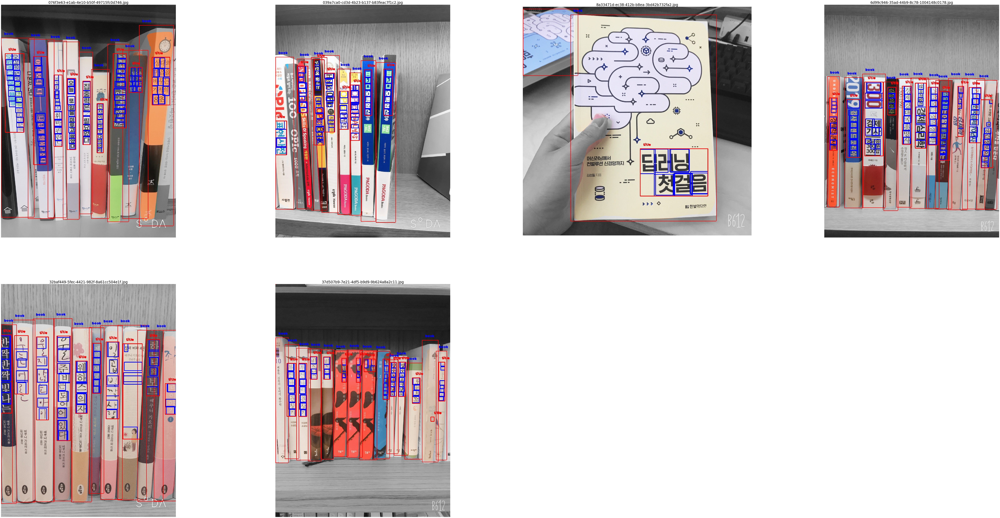

In [8]:
maskRcnnWithYolo(mode)
